### Non-Text Data Exploration

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('data/products.csv')
df.head()

,index,product,user_id,age,date,review,ratings,repurchase,packaging,price
0,0,Blush - Orgasm,Leahmoriah4,44-55,a month ago,"I'm 48, Caucasian with olive undertones so tru...",5.0,65%,4.1,4
1,1,Blush - Orgasm,Avalonian1172,30-35,2 months ago,I have to mention that the case is fabulous. A...,4.0,65%,4.1,4
2,2,Blush - Orgasm,summerseabreeze,30-35,4 months ago,A coral-pink peach blush with a very fine gold...,5.0,65%,4.1,4
3,3,Blush - Orgasm,miransees,30-35,5 months ago,"I'm not sure if it's a ""Universal"" color. It's...",3.0,65%,4.1,4
4,4,Blush - Orgasm,outofherhead,56 & Over,6 months ago,The blush that works for everyone does not wor...,2.0,65%,4.1,4


In [3]:
print(df.shape)
print(df.info())

(10348, 10)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10348 entries, 0 to 10347
Data columns (total 10 columns):
index         10348 non-null int64
product       10348 non-null object
user_id       10348 non-null object
age           10101 non-null object
date          10348 non-null object
review        10348 non-null object
ratings       10348 non-null float64
repurchase    10348 non-null object
packaging     10348 non-null float64
price         10348 non-null int64
dtypes: float64(2), int64(2), object(6)
memory usage: 808.6+ KB
None


In [4]:
# Check for presence of NaN values
df.isnull().sum()

index           0
product         0
user_id         0
age           247
date            0
review          0
ratings         0
repurchase      0
packaging       0
price           0
dtype: int64

In [5]:
# Replace rows with null values using most frequent Age Group
mode_age = df['age'].value_counts().head(1).index[0]
df['age'] = df['age'].fillna(mode_age)
df.isnull().sum()

index         0
product       0
user_id       0
age           0
date          0
review        0
ratings       0
repurchase    0
packaging     0
price         0
dtype: int64

In [6]:
df['product'].value_counts()
# Most popular product is Blush - Orgasm

Blush - Orgasm         5330
Blush - Deep Throat    1165
Blush - Sin             765
Blush - Torrid          497
Blush - Exhibit A       371
Blush - Amour           310
Blush - Luster          302
Blush - Angelika        297
Mata Hari Blush         272
Blush - Taj Mahal       262
Super Orgasm            249
Blush - Madly           248
Blush - Dolce Vita      155
Blush - Sex Appeal      125
Name: product, dtype: int64

In [7]:
df['user_id'].value_counts()
# Drop this feature because too many values but possible to explore if a user writing more reviews lead to higher likelihood of repurchasing

LayoverLifestyle              13
kathrynb23                    12
JGardella                     11
carrasco                      10
izzybella                      9
                              ..
CoconutVamp                    1
Leelee57                       1
rnaquin8382@brazosport.edu     1
LaurenJP1982                   1
hellokittybrock                1
Name: user_id, Length: 7954, dtype: int64

In [8]:
df['date'].value_counts()
# Drop '14 years ago' and above, regroup 'months ago' rows as 'a year ago'

11 years ago     1281
12 years ago     1248
10 years ago     1143
13 years ago      860
17 years ago      759
9 years ago       759
16 years ago      746
14 years ago      689
15 years ago      654
18 years ago      575
8 years ago       537
7 years ago       368
6 years ago       238
5 years ago       134
19 years ago      121
4 years ago        98
3 years ago        52
2 years ago        33
20 years ago       20
a year ago         17
6 months ago        4
10 months ago       3
9 months ago        2
a month ago         2
7 months ago        2
2 months ago        1
5 months ago        1
4 months ago        1
Name: date, dtype: int64

In [9]:
df['price'].value_counts()
# Drop this feature because not useful

4    10348
Name: price, dtype: int64

In [10]:
# Convert repurchase column from string to numeric
# df['repurchase'] = df['repurchase'].apply(lambda x : float(x.strip('%'))/100)

#Convert numeric columns to categorical
df['ratings'] = df['ratings'].astype(str)
df['packaging'] = df['packaging'].astype(str)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10348 entries, 0 to 10347
Data columns (total 10 columns):
index         10348 non-null int64
product       10348 non-null object
user_id       10348 non-null object
age           10348 non-null object
date          10348 non-null object
review        10348 non-null object
ratings       10348 non-null object
repurchase    10348 non-null object
packaging     10348 non-null object
price         10348 non-null int64
dtypes: int64(2), object(8)
memory usage: 808.6+ KB


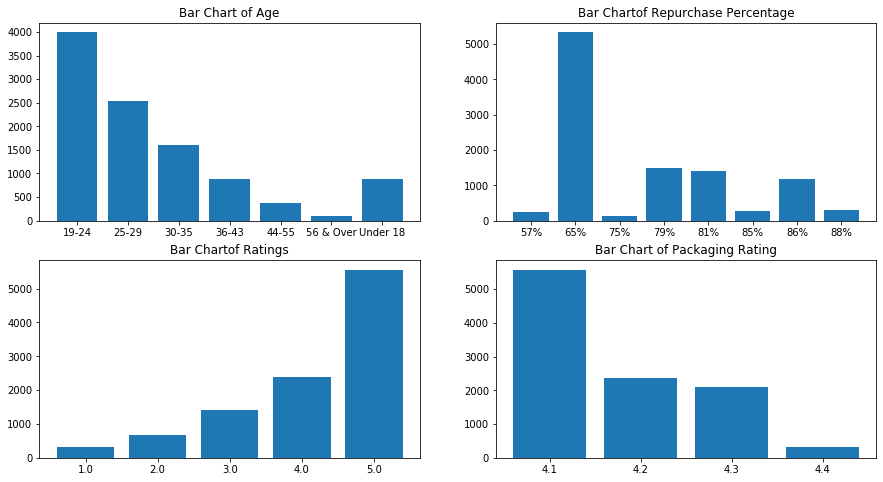

In [12]:
# Plot bar charts for Age, Ratings, Repurchase and Packaging
fig, ax = plt.subplots(2,2,figsize=(15,8))
ax[0,0].bar(df['age'].value_counts().sort_index().index,df['age'].value_counts().sort_index().values)
ax[0,0].title.set_text('Bar Chart of Age')
ax[1,0].bar(df['ratings'].value_counts().sort_index().index, df['ratings'].value_counts().sort_index().values)
ax[1,0].title.set_text('Bar Chartof Ratings')
ax[0,1].bar(df['repurchase'].value_counts().sort_index().index, df['repurchase'].value_counts().sort_index().values)
ax[0,1].title.set_text('Bar Chart of Repurchase Percentage')
ax[1,1].bar(df['packaging'].value_counts().sort_index().index, df['packaging'].value_counts().sort_index().values)
ax[1,1].title.set_text('Bar Chart of Packaging Rating')

# Most of the reviewers are millennials (reasonable, follows expectations)
# Repurchase percentages are generally quite high (all >= 50%)
# Overall Ratings are also generally quite high (more than half gave 5/5)
# Packaging rating also generally quite high (at least 4/5 stars)
# Reasonable and follows expectations because NARS is a famous makeup brand with high quality pigmented products

### Non-Text Data preprocessing (Shift to after Text Data Exploration)

In [235]:
df.drop(columns=['index','price','user_id'], inplace=True)

In [236]:
# Drop data from more than 13 years ago and regroup 'months ago' rows to 'a year ago'
drop_years = ['14 years ago', '15 years ago', '16 years ago', '17 years ago', '18 years ago', '19 years ago', '20 years ago' ]
df = df[~df['date'].isin(drop_years)].dropna().reset_index().drop(['index'], axis=1)
df['date'] = df['date'].apply(lambda x : x.replace(x,'a year ago') if 'month' in x else x)

In [237]:
df['date'].value_counts()

11 years ago    1281
12 years ago    1248
10 years ago    1143
13 years ago     860
9 years ago      759
8 years ago      537
7 years ago      368
6 years ago      238
5 years ago      134
4 years ago       98
3 years ago       52
2 years ago       33
a year ago        33
Name: date, dtype: int64

In [58]:
print(df.shape)
reviews = df.copy()

(10348, 10)


In [59]:
# repurchase again(1) if ratings 4/5 else won't repurchase again(0)
reviews['repurchase again'] = reviews['ratings'].apply(lambda x: 0 if float(x) < 4 else 1 )
reviews.drop(['ratings'], axis=1, inplace=True)
reviews.head()

,index,product,user_id,age,date,review,repurchase,packaging,price,repurchase again
0,0,Blush - Orgasm,Leahmoriah4,44-55,a month ago,"I'm 48, Caucasian with olive undertones so true pinks and mauves look terrible and corals are perfect which is why I LOVE this blush. I love the shimmer on my cheek bones and temples and use...",65%,4.1,4,1
1,1,Blush - Orgasm,Avalonian1172,30-35,2 months ago,I have to mention that the case is fabulous. All my other blushes are great but the case breaks towards the end of its use. This one is strong. Still together. Why can't other brands make their...,65%,4.1,4,1
2,2,Blush - Orgasm,summerseabreeze,30-35,4 months ago,A coral-pink peach blush with a very fine gold shimmer - which on my medium-olive skin tone (MAC NC40) seems to emphasize more of the gold than it does for example on my friend who's a MAC NC15....,65%,4.1,4,1
3,3,Blush - Orgasm,miransees,30-35,5 months ago,"I'm not sure if it's a ""Universal"" color. It's probably too light for me. It does make my skin look natural though, there is something more a women wants from a blusher. Also it's so small that...",65%,4.1,4,0
4,4,Blush - Orgasm,outofherhead,56 & Over,6 months ago,"The blush that works for everyone does not work for me. I got it in the mini size. I don’t know, on me it just looks like gold glitter, very sparkly, maybe my skin tone is too dark.",65%,4.1,4,0


In [60]:
# No need to account for class imbalance
reviews['repurchase again'].value_counts()

1    7954
0    2394
Name: repurchase again, dtype: int64

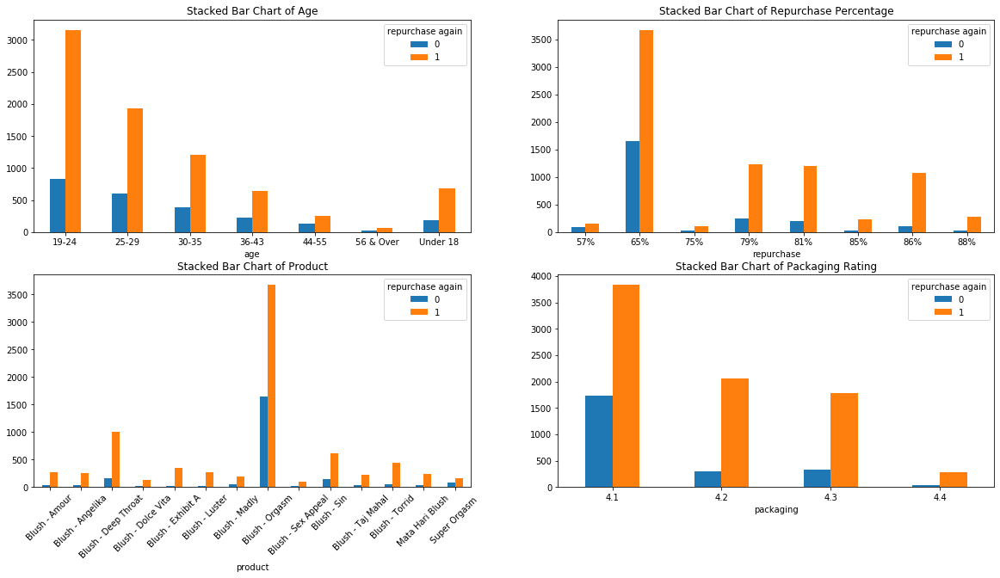

In [61]:
# Plot bar charts for Age, Ratings, Repurchase and Packaging
fig, ax = plt.subplots(2,2,figsize=(20,10))
reviews.groupby(['age','repurchase again'])['repurchase again'].count().unstack().plot(kind='bar',ax=ax[0,0])
ax[0,0].title.set_text('Stacked Bar Chart of Age')
ax[0,0].tick_params(axis='x', labelrotation=0)
reviews.groupby(['product','repurchase again'])['repurchase again'].count().unstack().plot(kind='bar',ax=ax[1,0])
ax[1,0].title.set_text('Stacked Bar Chart of Product')
ax[1,0].tick_params(axis='x', labelrotation=45)
reviews.groupby(['repurchase','repurchase again'])['repurchase again'].count().unstack().plot(kind='bar',ax=ax[0,1])
ax[0,1].title.set_text('Stacked Bar Chart of Repurchase Percentage')
ax[0,1].tick_params(axis='x', labelrotation=0)
reviews.groupby(['packaging','repurchase again'])['repurchase again'].count().unstack().plot(kind='bar',ax=ax[1,1])
ax[1,1].title.set_text('Stacked Bar Chart of Packaging Rating')
ax[1,1].tick_params(axis='x', labelrotation=0)

# Generally, most people are willing to repurchase in every category
# Should delve more into Blush - Orgasm
# 65% Repurchase Percentage, Blush - Orgasm and 4.1 Packaging Rating have a much higher proportion of those not willing to repurchase; should analyze these groups 

In [209]:
# Conduct One-hot Encoding for Product and Age because they are nominal data (have to remove 1 dummy variable column to remove multi-collinearity problem)
reviews = pd.concat([reviews, pd.get_dummies(reviews['product'], prefix='product', drop_first=True)], axis=1)
reviews = pd.concat([reviews, pd.get_dummies(reviews['age'], prefix='age', drop_first=True)], axis=1)
reviews.drop(columns=['product','age'], inplace=True)

In [211]:
reviews.shape

(6784, 24)

In [212]:
# Conduct Label Encoding for Packaging, Repurchase Percentage, Date because they are ordinal data 
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
reviews['packaging'] = label_encoder.fit_transform(reviews['packaging'])
reviews['repurchase'] = label_encoder.fit_transform(reviews['repurchase'])
reviews['date'] = label_encoder.fit_transform(reviews['date'])

### Text Preprocessing

In [13]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to C:\Users\Gladys
[nltk_data]     Koh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Gladys
[nltk_data]     Koh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [62]:
pd.set_option('display.max_colwidth', 200)
reviews['review'].head(20)
# Presence of emojis, contractions, digits associated with the product, punctuations, upper cases, digits

0          I'm 48, Caucasian with olive undertones so true pinks and mauves look terrible and corals are perfect which is why I LOVE this blush.  I love the shimmer on my cheek bones and temples and use...
1        I have to mention that the case is fabulous. All my other blushes are great but the case breaks towards the end of its use. This one is strong. Still together. Why can't other brands make their...
2       A coral-pink peach blush with a very fine gold shimmer - which on my medium-olive skin tone (MAC NC40) seems to emphasize more of the gold than it does for example on my friend who's a MAC NC15....
3        I'm not sure if it's a "Universal" color. It's probably too light for me. It does make my skin look natural though, there is something more a women wants from a blusher. Also it's so small that...
4                       The blush that works for everyone does not work for me. I got it in the mini size. I don’t know, on me it just looks like gold glitter, very sparkly, ma

In [63]:
contractions_dict = {
"ain't": "is not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how is",
"I'd": "I would",
"I'd've": "I would have",
"I'll": "I will",
"I'll've": "I will have",
"I'm": "I am",
"I've": "I have",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what will",
"what'll've": "what will have",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"when've": "when have",
"where'd": "where did",
"where's": "where is",
"where've": "where have",
"who'll": "who will",
"who'll've": "who will have",
"who's": "who is",
"who've": "who have",
"why's": "why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you would",
"you'd've": "you would have",
"you'll": "you will",
"you'll've": "you will have",
"you're": "you are",
"you've": "you have"
}

In [64]:
import re 

# Function to perform expansion of contractions
def expand_contractions(text, contraction_mapping=contractions_dict):
    
    contractions_pattern = re.compile('({})'.format('|'.join(contraction_mapping.keys())), 
                                      flags=re.IGNORECASE|re.DOTALL)
    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contraction_mapping.get(match)\
                                if contraction_mapping.get(match)\
                                else contraction_mapping.get(match.lower())                       
        expanded_contraction = first_char+expanded_contraction[1:]
        return expanded_contraction
        
    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)
    return expanded_text

In [65]:
# common words removal? spelling correction? contraction expansion? check if legit word?
## convert to lowercase
reviews['review_processed'] = reviews['review'].apply(lambda x: x.lower())

## contraction expansion
reviews['review_processed'] = reviews['review_processed'].apply(lambda x : expand_contractions(x,contractions_dict))

## removing punctuations
reviews['review_processed'] = reviews['review_processed'].str.replace('[^\w\s]','')

## removing digits (including words that contain digits because makeup products )
reviews['review_processed'] = reviews['review_processed'].apply(lambda x: re.sub('\w*\d\w*','', x))

## remove website links 
reviews['review_processed'] = reviews['review_processed'].apply(lambda x: re.sub(r'http\S+', '', x))

## remove leading and ending whitespace (if any)
reviews['review_processed'] = reviews['review_processed'].apply(lambda x: x.strip())

## removing default stopwords
from nltk.corpus import stopwords
stop = stopwords.words('english')
reviews['review_processed'] = reviews['review_processed'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

from textblob import TextBlob, Word
## lemmatization
reviews['review_processed'] = reviews['review_processed'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

## Spell check
#reviews['review_processed'] = reviews['review_processed'].apply(lambda x: " ".join([TextBlob(word).correct() for word in x.split()]))

In [66]:
pd.set_option('display.max_colwidth', 200)
reviews['review_processed'].head(10)
# pd.reset_option('display.max_colwidth')

0                         caucasian olive undertone true pink mauve look terrible coral perfect love blush love shimmer cheek bone temple use
1                                    mention case fabulous blush great case break towards end use one strong still together cannot brand make
2                                   coralpink peach blush fine gold shimmer mediumolive skin tone mac seems emphasize gold example friend mac
3                                   sure universal color probably light make skin look natural though something woman want blusher also small
4                                        blush work everyone work got mini size dont know look like gold glitter sparkly maybe skin tone dark
5                         super late orgasm train must admit alway drawn deep thoart doesnt gold shimmer got generous sample card nars decide
6                       one blush ever repurchased great every day glowy blush however time bought product slightly different eg size shimmer
7    p

Text Vectorization
- Bag-of-Words
- TF-IDF
- Word embeddings

In [23]:
import spacy
nlp = spacy.load("en_core_web_sm")

In [67]:
# Create new features
reviews['polarity'] = reviews['review_processed'].apply(lambda x:TextBlob(x).sentiment.polarity)
reviews['subjectivity'] = reviews['review_processed'].apply(lambda x:TextBlob(x).sentiment.subjectivity)
reviews['word_count'] = reviews['review_processed'].apply(lambda x: len(str(x).split(" ")))
reviews['char_count'] = reviews['review_processed'].apply(lambda x: sum(len(word) for word in str(x).split(" ")))
reviews['sentence_count'] = reviews['review_processed'].apply(lambda x: len(str(x).split(".")))
reviews['avg_word_length'] = reviews['char_count'] / reviews['word_count']
reviews['avg_sentence_length'] = reviews['word_count'] / reviews['sentence_count']

In [68]:
print(reviews.shape)
reviews.head()

(10348, 18)


,index,product,user_id,age,date,review,repurchase,packaging,price,repurchase again,review_processed,polarity,subjectivity,word_count,char_count,sentence_count,avg_word_length,avg_sentence_length
0,0,Blush - Orgasm,Leahmoriah4,44-55,a month ago,"I'm 48, Caucasian with olive undertones so true pinks and mauves look terrible and corals are perfect which is why I LOVE this blush. I love the shimmer on my cheek bones and temples and use...",65%,4.1,4,1,caucasian olive undertone true pink mauve look terrible coral perfect love blush love shimmer cheek bone temple use,0.208333,0.691667,18,98,1,5.444444,18.0
1,1,Blush - Orgasm,Avalonian1172,30-35,2 months ago,I have to mention that the case is fabulous. All my other blushes are great but the case breaks towards the end of its use. This one is strong. Still together. Why can't other brands make their...,65%,4.1,4,1,mention case fabulous blush great case break towards end use one strong still together cannot brand make,0.544444,0.827778,17,88,1,5.176471,17.0
2,2,Blush - Orgasm,summerseabreeze,30-35,4 months ago,A coral-pink peach blush with a very fine gold shimmer - which on my medium-olive skin tone (MAC NC40) seems to emphasize more of the gold than it does for example on my friend who's a MAC NC15....,65%,4.1,4,1,coralpink peach blush fine gold shimmer mediumolive skin tone mac seems emphasize gold example friend mac,0.416667,0.500000,16,90,1,5.625000,16.0
3,3,Blush - Orgasm,miransees,30-35,5 months ago,"I'm not sure if it's a ""Universal"" color. It's probably too light for me. It does make my skin look natural though, there is something more a women wants from a blusher. Also it's so small that...",65%,4.1,4,0,sure universal color probably light make skin look natural though something woman want blusher also small,0.150000,0.477778,16,90,1,5.625000,16.0
4,4,Blush - Orgasm,outofherhead,56 & Over,6 months ago,"The blush that works for everyone does not work for me. I got it in the mini size. I don’t know, on me it just looks like gold glitter, very sparkly, maybe my skin tone is too dark.",65%,4.1,4,0,blush work everyone work got mini size dont know look like gold glitter sparkly maybe skin tone dark,-0.150000,0.400000,18,83,1,4.611111,18.0


In [69]:
print("5 Random Reviews with Highest Polarity:")
for index,review in enumerate(reviews.iloc[reviews['polarity'].sort_values(ascending=False)[:5].index]['review_processed']):
  print('Review {}:\n'.format(index+1),review)

print("5 Random Reviews with Highest Subjectivity:")
for index,review in enumerate(reviews.iloc[reviews['subjectivity'].sort_values(ascending=False)[:5].index]['review_processed']):
  print('Review {}:\n'.format(index+1),review)

5 Random Reviews with Highest Polarity:
Review 1:
 perfect blush work well skin tone help cheekbone look defined shimmer work
Review 2:
 like shade shimmer give peachy glow face one best colour use summertime
Review 3:
 called orgasm ask use look like night hottest best sex ever sex give glow people tell gotten laid
Review 4:
 work well applies evenly must blush nars make best blush texturewise
Review 5:
 perfect blush
5 Random Reviews with Highest Subjectivity:
Review 1:
 spring collection beautiful alternative like orgasm punch brighter pigmented compared mac style blush well torrid le
Review 2:
 color wonderful use sparingly day work bit bronzer night
Review 3:
 alright reading rave review blush almost every magazine beauty blog finally cave bought admit extremely pleased result
Review 4:
 favourite blush mediumolive skin tone sooo pretty
Review 5:
 received blush swap depite reading review show well nc skintone glad report blush orgasm look wonderful


In [70]:
print("5 Random Reviews with Lowest Polarity:")
for index,review in enumerate(reviews.iloc[reviews['polarity'].sort_values(ascending=True)[:5].index]['review_processed']):
  print('Review {}:\n'.format(index+1),review)

print("5 Random Reviews with Lowest Subjectivity:")
for index,review in enumerate(reviews.iloc[reviews['subjectivity'].sort_values(ascending=True)[:5].index]['review_processed']):
  print('Review {}:\n'.format(index+1),review)

5 Random Reviews with Lowest Polarity:
Review 1:
 worst blush ever sparkle awful nars insist putting glitter blush
Review 2:
 tanned brown skinfocus word brown blush looked orange meand brown orange horrible together
Review 3:
 worst ingredient ever
Review 4:
 horrible horrible horrible anyone age opinion see fairydust gold sparkle cheek used ugh gold sparkle sit inside
Review 5:
 horrible color oily skin make look soooo shiny also glitter fall face blush broke apart purse like one week glitter everywhere hated
5 Random Reviews with Lowest Subjectivity:
Review 1:
 use every day think ever wanted use anything else color come go color keep buying get
Review 2:
 ug work asian skin look orangepink
Review 3:
 never worn blush orgasm although think product popularity come suggestive name blush ball ahead peachy coral color mimic
Review 4:
 tengo bastantes coloretes de nars este e sin duda uno de mi favoritos e un color piel entre bronceado rosado que queda espectacularmente bien en la mejill

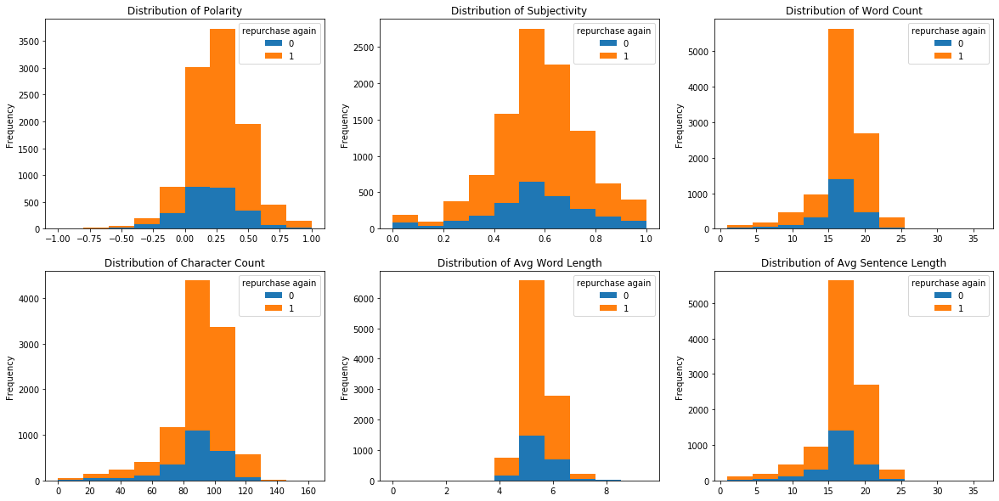

In [87]:
# Didn't plot Sentence because every row has only 1 sentence
fig, ax = plt.subplots(2,3,figsize=(20,10))
reviews.pivot(columns='repurchase again').polarity.plot(kind = 'hist',stacked=True,ax=ax[0,0])
ax[0,0].title.set_text('Distribution of Polarity')
reviews.pivot(columns='repurchase again').subjectivity.plot(kind = 'hist',stacked=True, ax=ax[0,1])
ax[0,1].title.set_text('Distribution of Subjectivity')
reviews.pivot(columns='repurchase again').word_count.plot(kind = 'hist',stacked=True,ax=ax[0,2])
ax[0,2].title.set_text('Distribution of Word Count')
reviews.pivot(columns='repurchase again').char_count.plot(kind = 'hist',stacked=True,ax=ax[1,0])
ax[1,0].title.set_text('Distribution of Character Count')
reviews.pivot(columns='repurchase again').avg_word_length.plot(kind = 'hist',stacked=True,ax= ax[1,1])
ax[1,1].title.set_text('Distribution of Avg Word Length')
reviews.pivot(columns='repurchase again').avg_sentence_length.plot(kind = 'hist',stacked=True,ax= ax[1,2])
ax[1,2].title.set_text('Distribution of Avg Sentence Length')

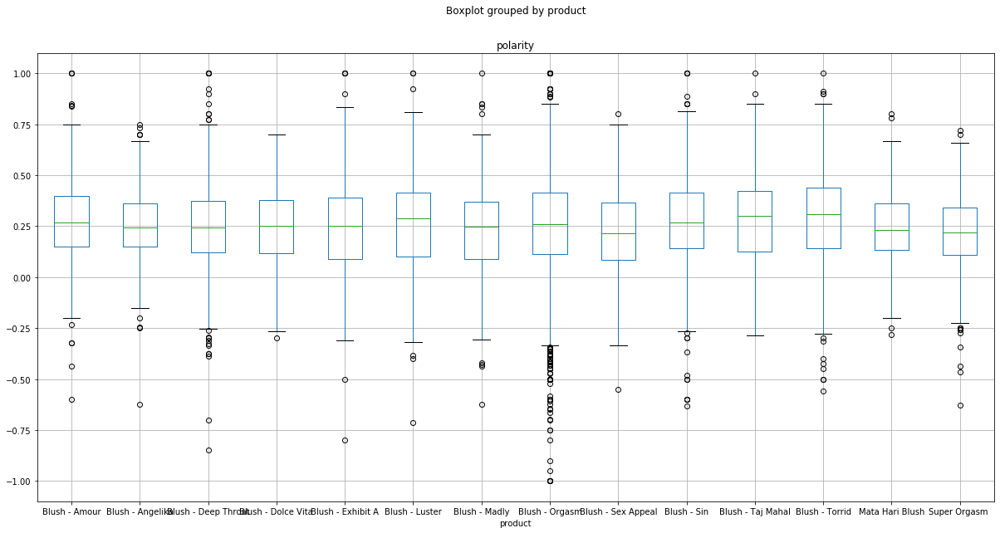

In [84]:
reviews.boxplot('polarity',by='product',figsize=(20,10))
## Blush - Orgasm has the most negative sentiment score; NARS should look into this product more specifically

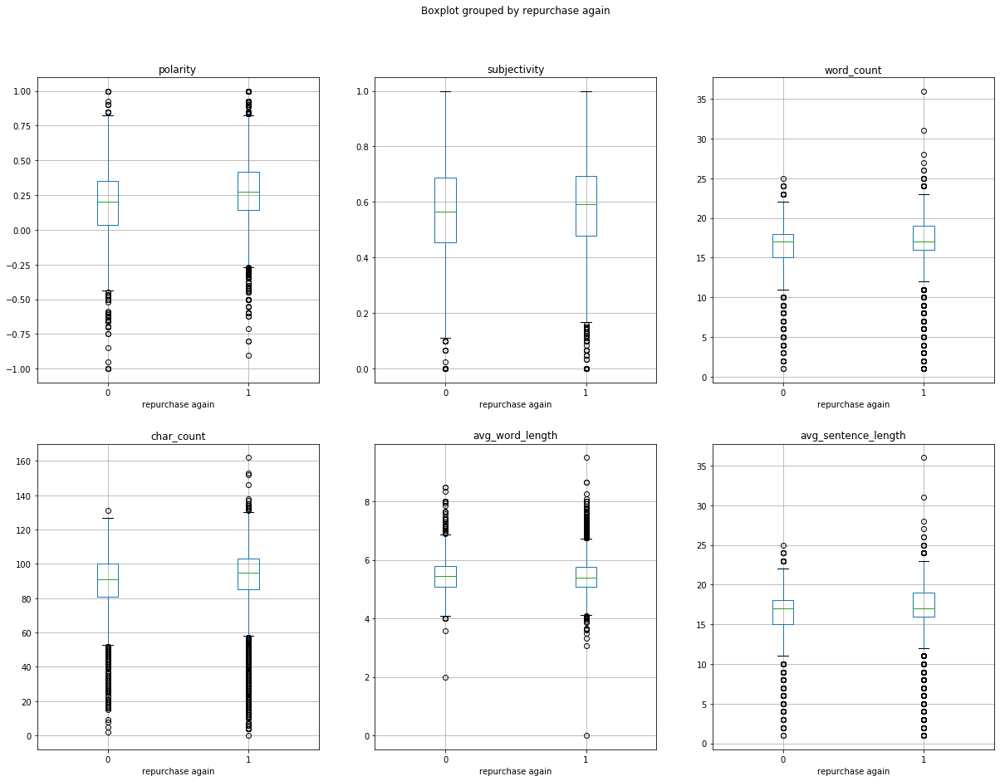

In [89]:
fig, ax = plt.subplots(2,3,figsize=(20,15))
reviews.boxplot('polarity',by='repurchase again',ax=ax[0,0])
reviews.boxplot('subjectivity',by='repurchase again',ax=ax[0,1])
reviews.boxplot('word_count',by='repurchase again',ax=ax[0,2])
reviews.boxplot('char_count',by='repurchase again',ax=ax[1,0])
reviews.boxplot('avg_word_length',by='repurchase again',ax=ax[1,1])
reviews.boxplot('avg_sentence_length',by='repurchase again',ax=ax[1,2])

# Those who repurchase again have higher polarity, higher subjectivity, lower word count, higher character count, lower average word length and lower average sentence length compared to those who don't repurchase again

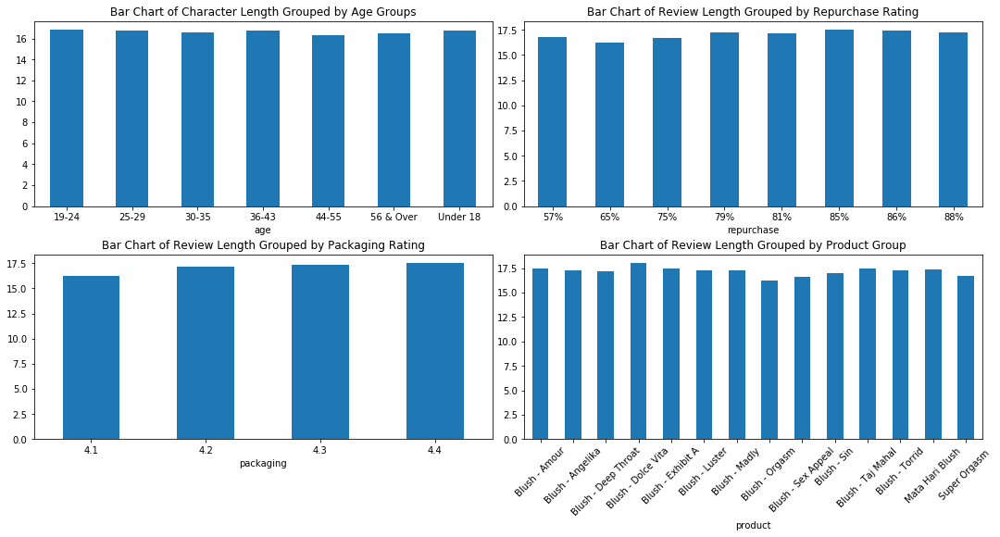

In [93]:
# Plot histograms for Age, Packaging, Repurchase and Product
fig, ax = plt.subplots(2,2,figsize=(15,8))
reviews.groupby(['age'])['word_count'].mean().plot(kind='bar',ax=ax[0,0])
ax[0,0].title.set_text('Bar Chart of Character Length Grouped by Age Groups')
ax[0,0].tick_params(axis='x', labelrotation=0)
reviews.groupby(['packaging'])['word_count'].mean().plot(kind='bar',ax=ax[1,0])
ax[1,0].title.set_text('Bar Chart of Review Length Grouped by Packaging Rating')
ax[1,0].tick_params(axis='x', labelrotation=0)
reviews.groupby(['repurchase'])['word_count'].mean().plot(kind='bar',ax=ax[0,1])
ax[0,1].title.set_text('Bar Chart of Review Length Grouped by Repurchase Rating')
ax[0,1].tick_params(axis='x', labelrotation=0)
reviews.groupby(['product'])['word_count'].mean().plot(kind='bar',ax=ax[1,1])
ax[1,1].title.set_text('Bar Chart of Review Length Grouped by Product Group')
ax[1,1].tick_params(axis='x', labelrotation=45)
fig.tight_layout(pad=0.5)

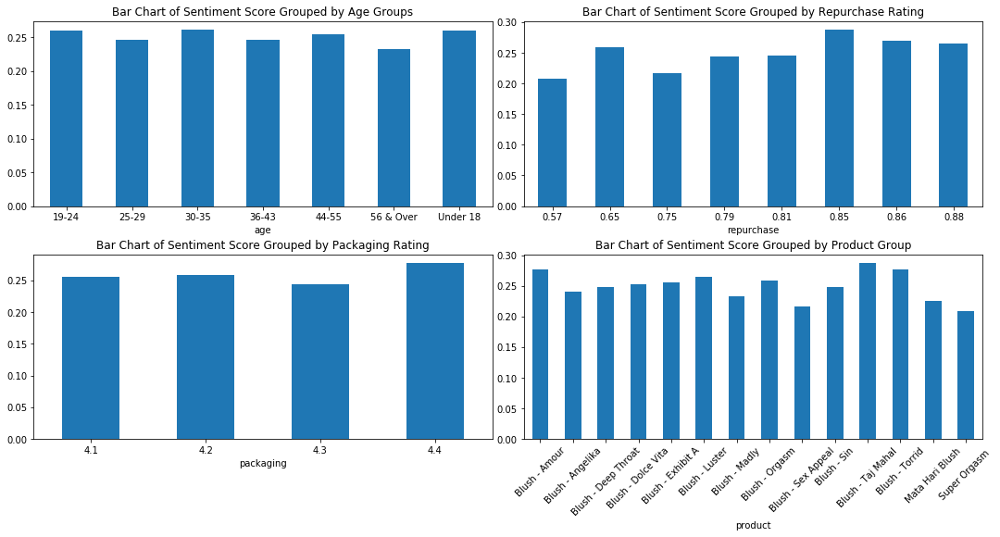

In [71]:
# Plot histograms for Age, Packaging, Repurchase and Product
fig, ax = plt.subplots(2,2,figsize=(15,8))
reviews.groupby(['age'])['polarity'].mean().plot(kind='bar',ax=ax[0,0])
ax[0,0].title.set_text('Bar Chart of Sentiment Score Grouped by Age Groups')
ax[0,0].tick_params(axis='x', labelrotation=0)
reviews.groupby(['packaging'])['polarity'].mean().plot(kind='bar',ax=ax[1,0])
ax[1,0].title.set_text('Bar Chart of Sentiment Score Grouped by Packaging Rating')
ax[1,0].tick_params(axis='x', labelrotation=0)
reviews.groupby(['repurchase'])['polarity'].mean().plot(kind='bar',ax=ax[0,1])
ax[0,1].title.set_text('Bar Chart of Sentiment Score Grouped by Repurchase Rating')
ax[0,1].tick_params(axis='x', labelrotation=0)
reviews.groupby(['product'])['polarity'].mean().plot(kind='bar',ax=ax[1,1])
ax[1,1].title.set_text('Bar Chart of Sentiment Score Grouped by Product Group')
ax[1,1].tick_params(axis='x', labelrotation=45)
fig.tight_layout(pad=0.5)

## Expected because those with higher sentiment score should be more likely to repurchase again

In [24]:
# Use Bag-Of-Words
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer()

In [249]:
df_grouped = reviews.groupby(by='product').agg(lambda x: ' '.join(x))

In [26]:
data = vect.fit_transform(df_grouped['review_processed'])

In [27]:
df_dtm = pd.DataFrame(data.toarray(), columns= vect.get_feature_names())
df_dtm.index = df_grouped.index

In [28]:
df_dtm.head(10)

,aa,aaaaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhhhhhhhhh,aaahi,aab,aahing,aalllllll,aand,abh,ability,abino,...,yup,zen,zero,zillion,zinc,zo,zone,zoo,über,übercool
product,,,,,,,,,,,,,,,,,,,,,
Blush - Amour,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Angelika,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Deep Throat,0,0,0,0,1,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
Blush - Dolce Vita,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Exhibit A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Luster,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Blush - Madly,0,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0
Blush - Orgasm,0,0,0,0,0,1,1,0,0,0,...,1,1,2,2,1,1,0,0,0,1
Blush - Sex Appeal,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


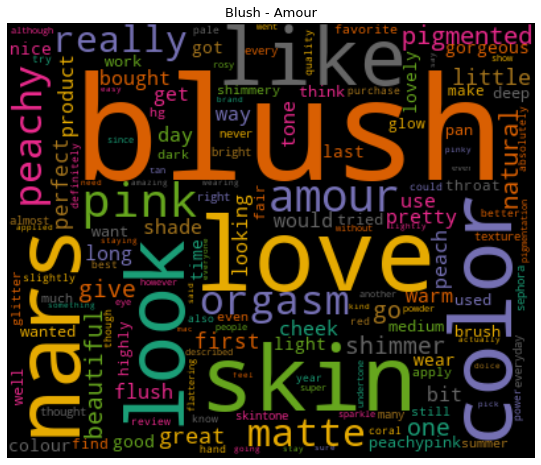

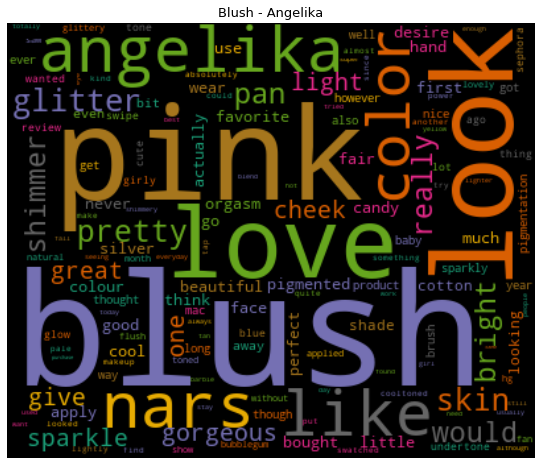

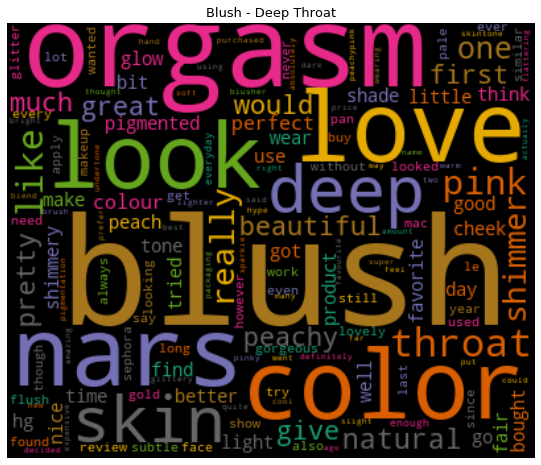

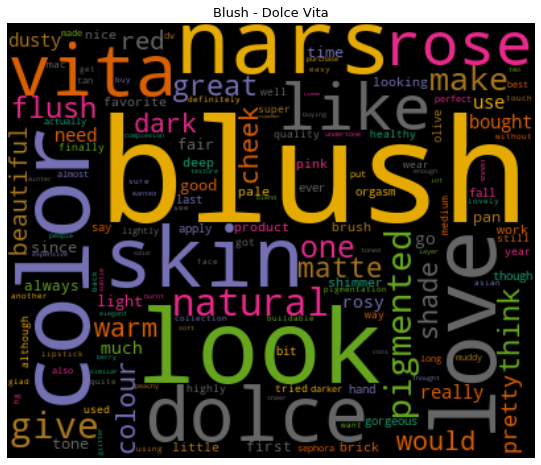

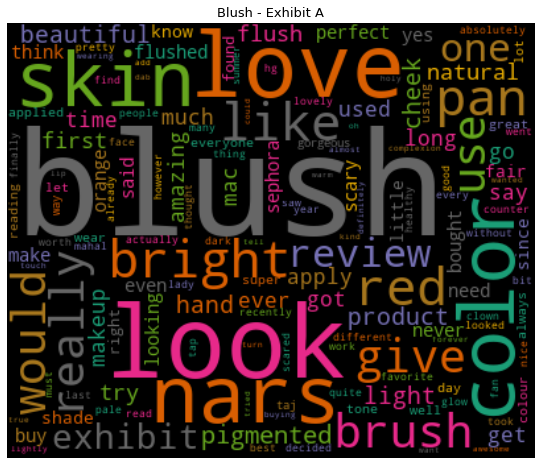

...

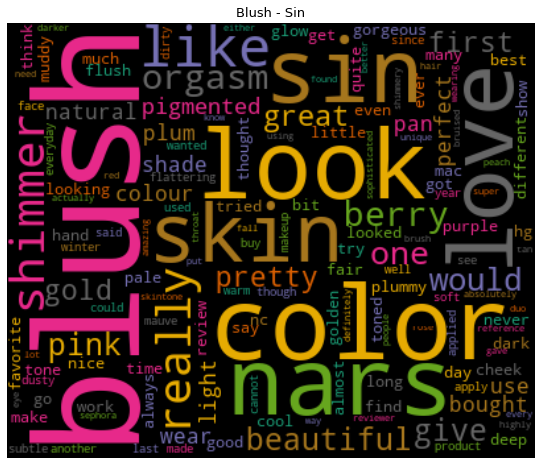

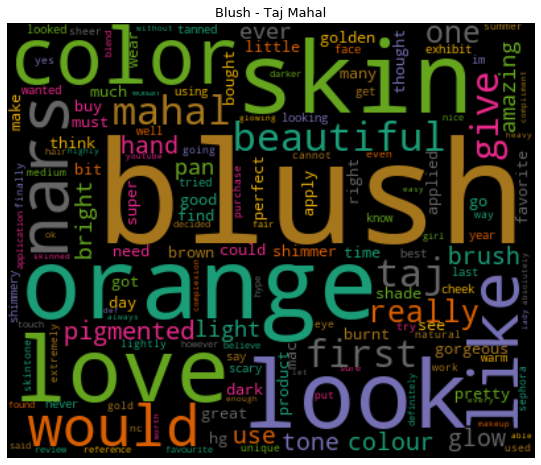

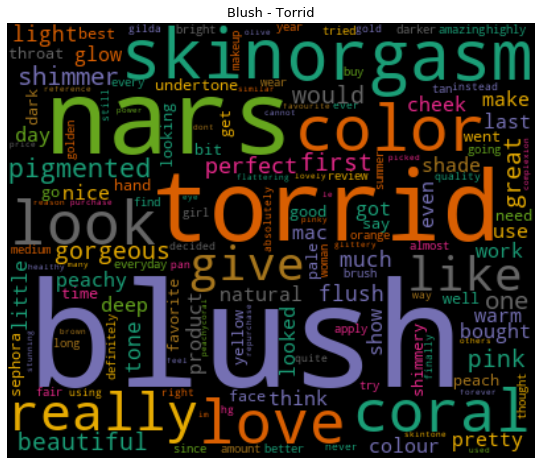

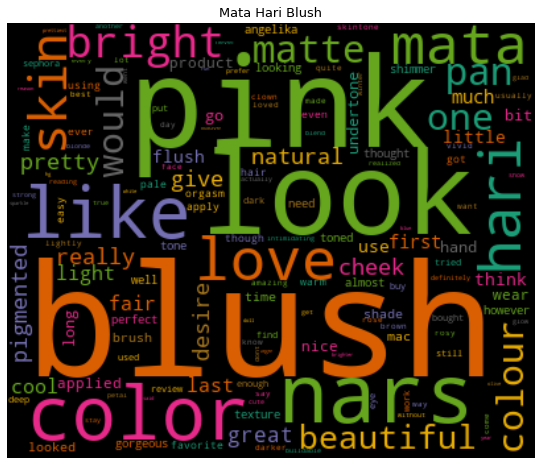

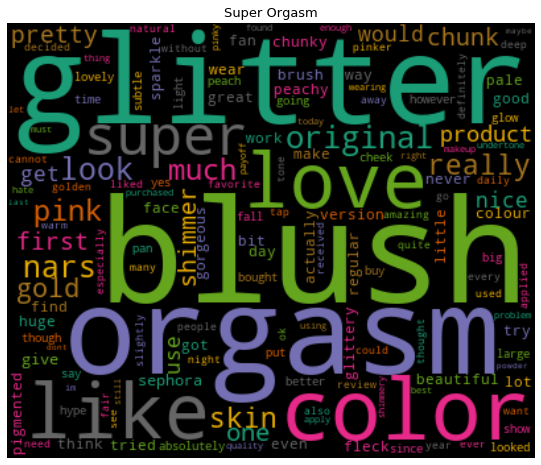

In [29]:
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()
  
# Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each product
for index,product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending=False),product)

## Blush, look appears in every product, they are domain-specific stop words to be removed

In [124]:
#Remove words that appear more than 50% of the documents
vect = CountVectorizer(max_df=0.5)

In [125]:
df_grouped = reviews.groupby(by='product').agg(lambda x: ' '.join(x))
data = vect.fit_transform(df_grouped['review_processed'])
df_dtm = pd.DataFrame(data.toarray(), columns= vect.get_feature_names())
df_dtm.index = df_grouped.index

In [126]:
df_dtm.head(10)

,aa,aaaaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhhhhhhhhh,aaahi,aab,aahing,aalllllll,aand,abh,ability,abino,...,yup,zen,zero,zillion,zinc,zo,zone,zoo,über,übercool
product,,,,,,,,,,,,,,,,,,,,,
Blush - Amour,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Angelika,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Deep Throat,0,0,0,0,1,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
Blush - Dolce Vita,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Exhibit A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Blush - Luster,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Blush - Madly,0,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0
Blush - Orgasm,0,0,0,0,0,1,1,0,0,0,...,1,1,2,2,1,1,0,0,0,1
Blush - Sex Appeal,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


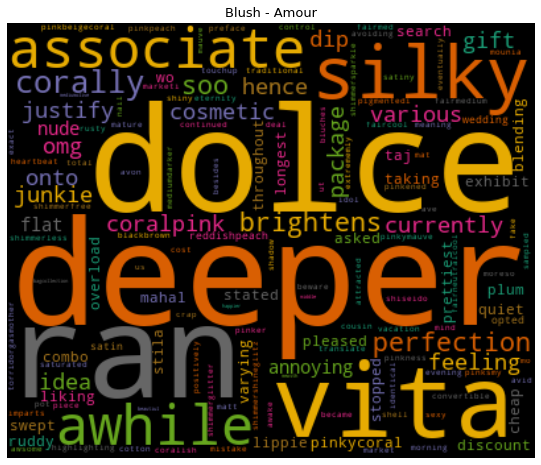

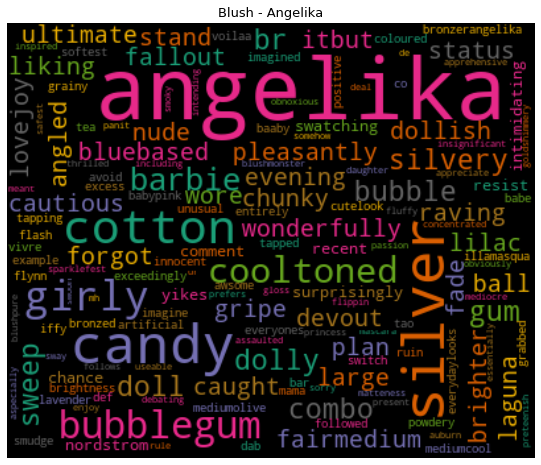

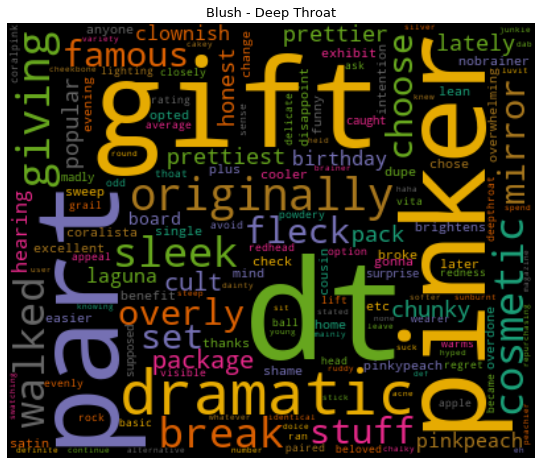

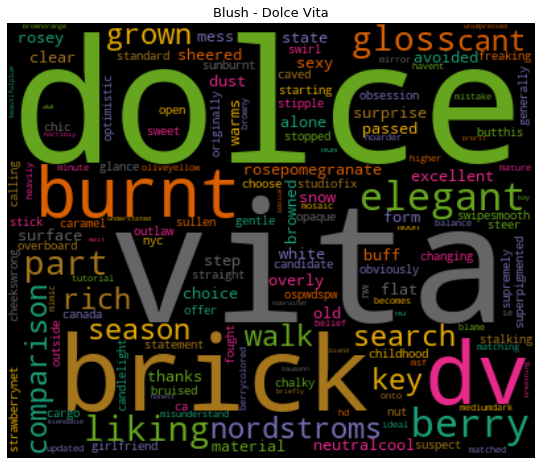

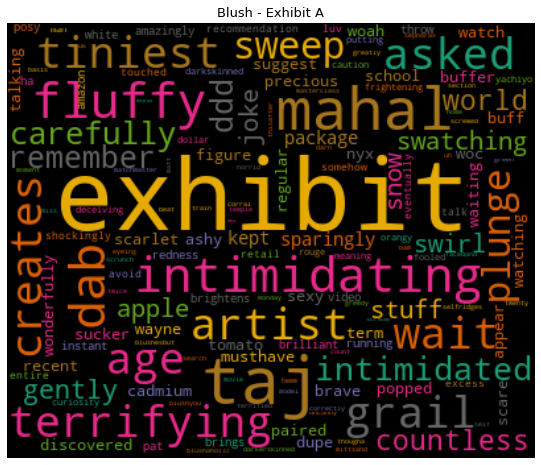

...

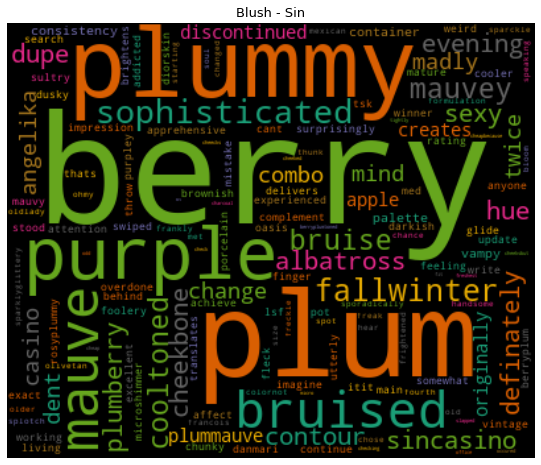

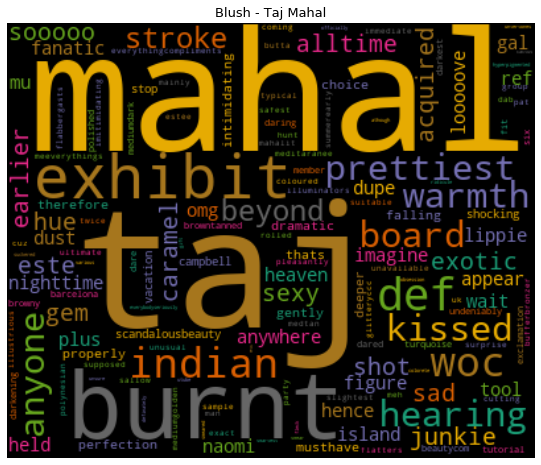

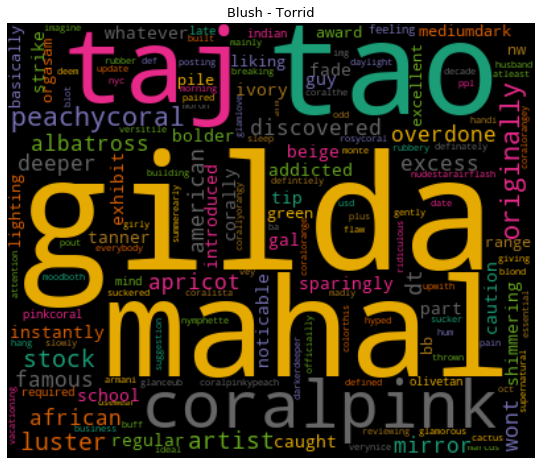

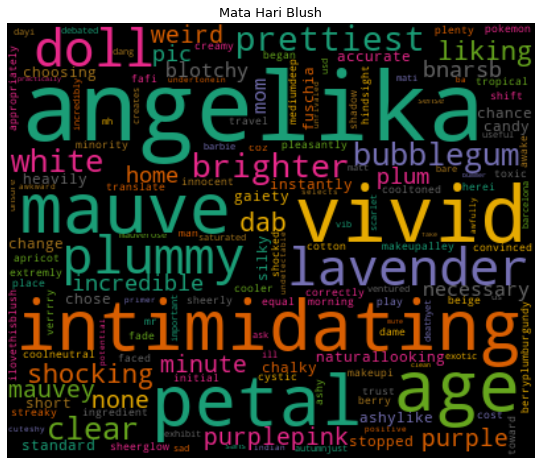

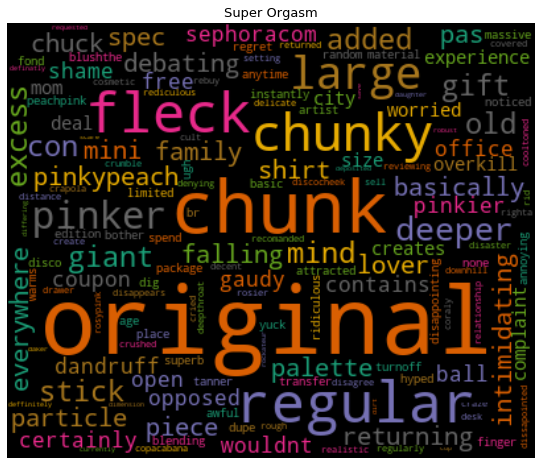

In [127]:
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()
  
# Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each product
for index,product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending=False),product)

## Blush - Orgasm seems quite unappealing because "overrated" appears the most often

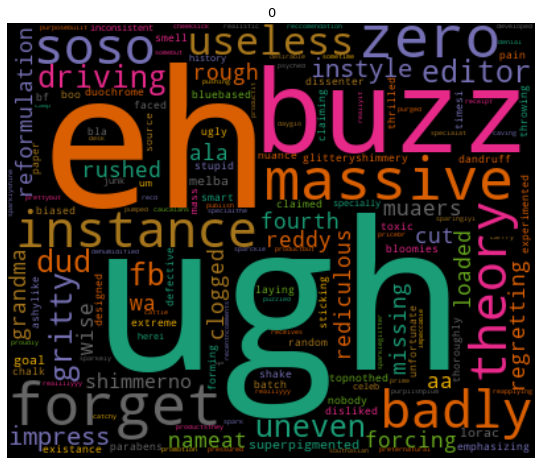

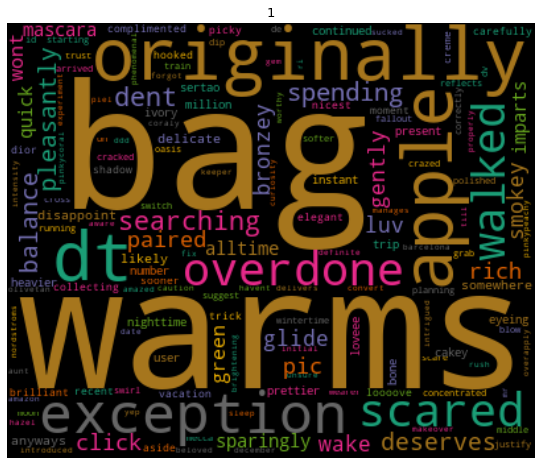

In [104]:
df_grouped = reviews.groupby(by='repurchase again').agg(lambda x: ' '.join(x))
data = vect.fit_transform(df_grouped['review_processed'])
df_dtm = pd.DataFrame(data.toarray(), columns= vect.get_feature_names())
df_dtm.index = df_grouped.index

# Function for generating word clouds
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()
  
# Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each product
for index,product in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[product].sort_values(ascending=False),str(product))